In [1]:
import torch
from fastai.vision.all import *

In [2]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
import warnings
warnings.filterwarnings("ignore", message="'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'")

In [4]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [5]:
path = "/content/drive/MyDrive/Colab_Notebooks/tomato"

In [6]:
dblock = DataBlock(
    blocks  = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2, seed = 42),
    item_tfms = RandomResizedCrop(size = 224),
    batch_tfms = [*aug_transforms(size=224), Normalize.from_stats(*imagenet_stats)],
    get_y = parent_label
)

In [7]:
#Create DataLoaders
dls = dblock.dataloaders(path)

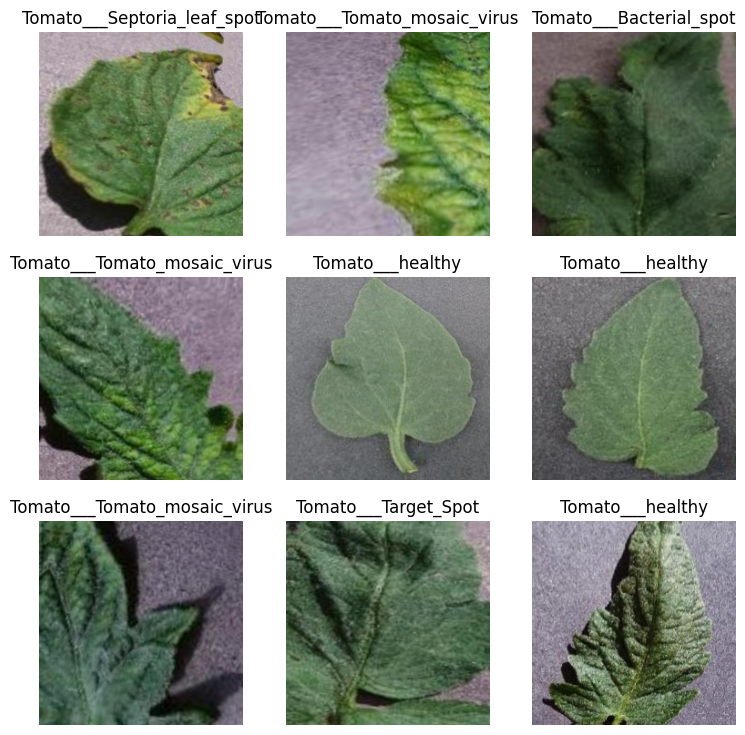

In [8]:
dls.show_batch()

In [9]:
learn_resnet = vision_learner(dls, resnet50,metrics = accuracy)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 101MB/s]


In [10]:
learn_resnet.fine_tune(epochs = 3)

epoch,train_loss,valid_loss,accuracy,time
0,1.326929,0.741076,0.763636,17:55


epoch,train_loss,valid_loss,accuracy,time
0,0.715854,0.361263,0.887273,01:41
1,0.462182,0.312264,0.914091,01:42
2,0.346127,0.274973,0.922273,01:46


In [18]:
interp = ClassificationInterpretation.from_learner(learn_resnet)


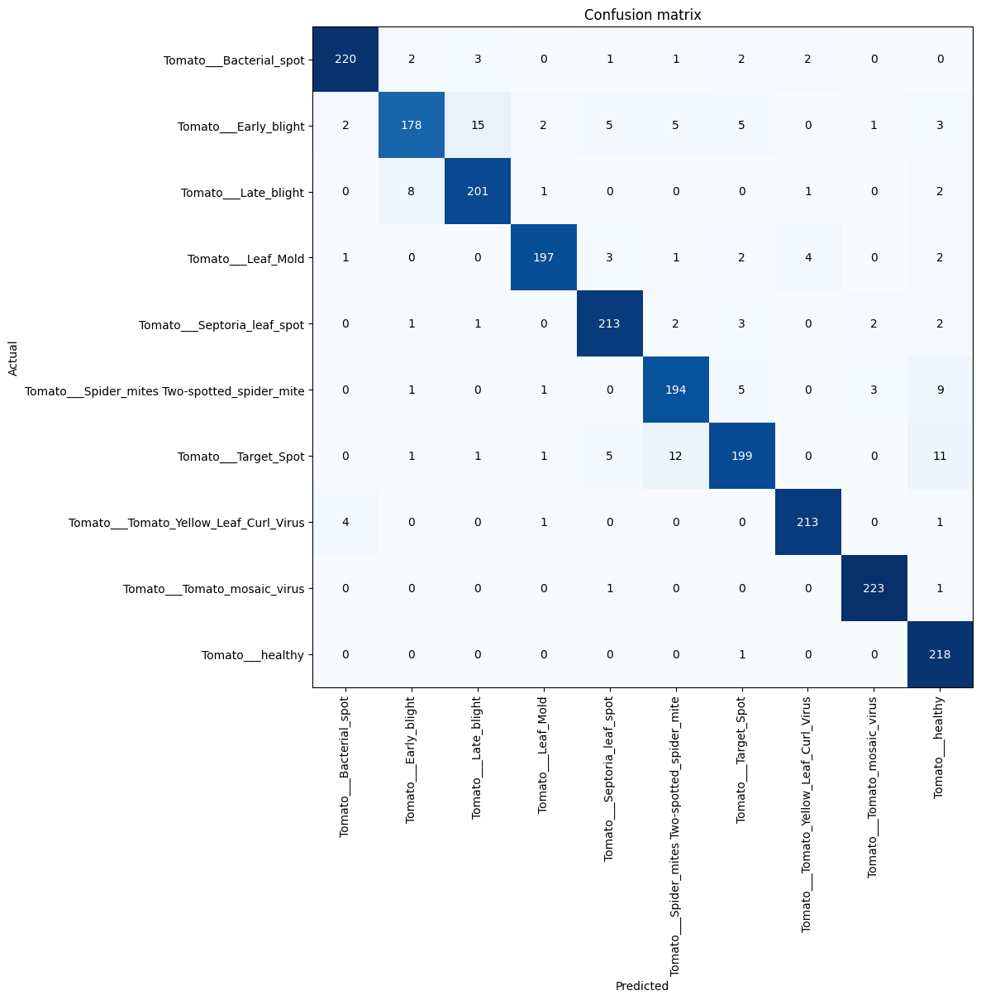

In [17]:
interp.plot_confusion_matrix(figsize=(12,12))

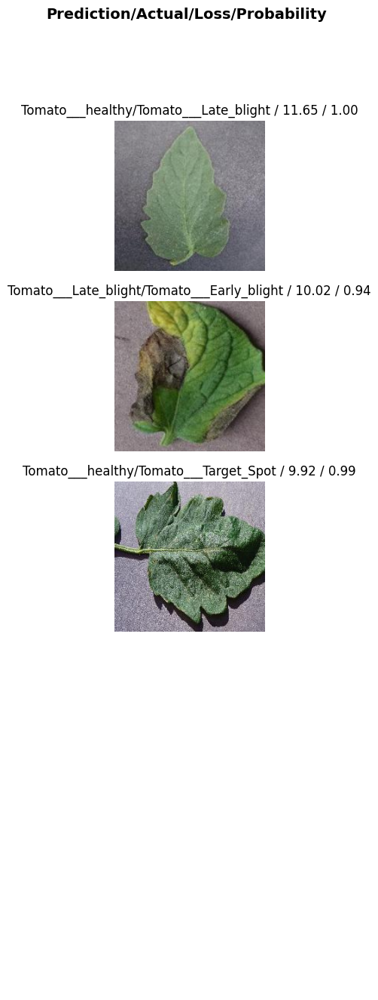

In [27]:
interp.plot_top_losses(3, nrows=5)

In [31]:
from fastai.vision.widgets import ImageClassifierCleaner


In [32]:
cleaner_res = ImageClassifierCleaner(learn_resnet)
cleaner_res

In [12]:
from torchvision.models import vgg16

In [13]:
learn_vgg = vision_learner(dls, vgg16, metrics = accuracy)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:05<00:00, 98.3MB/s]


In [14]:
learn_vgg.fine_tune(epochs = 3)

epoch,train_loss,valid_loss,accuracy,time
0,1.485329,0.572586,0.816818,01:08


epoch,train_loss,valid_loss,accuracy,time
0,0.813205,0.360301,0.889091,02:19
1,0.579155,0.225576,0.930455,02:21
2,0.466323,0.214264,0.934545,02:29


In [22]:
interp_vgg = ClassificationInterpretation.from_learner(learn_vgg)


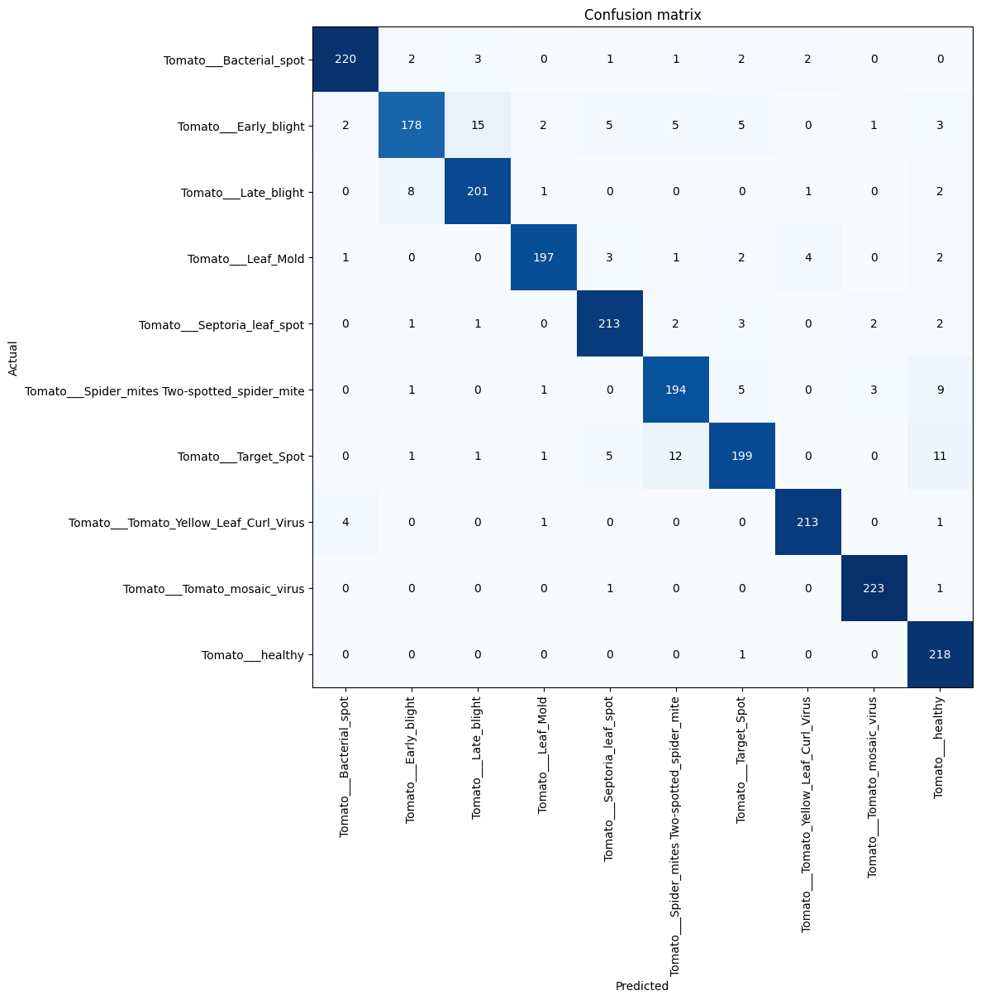

In [23]:
interp_vgg.plot_confusion_matrix(figsize=(12,12))

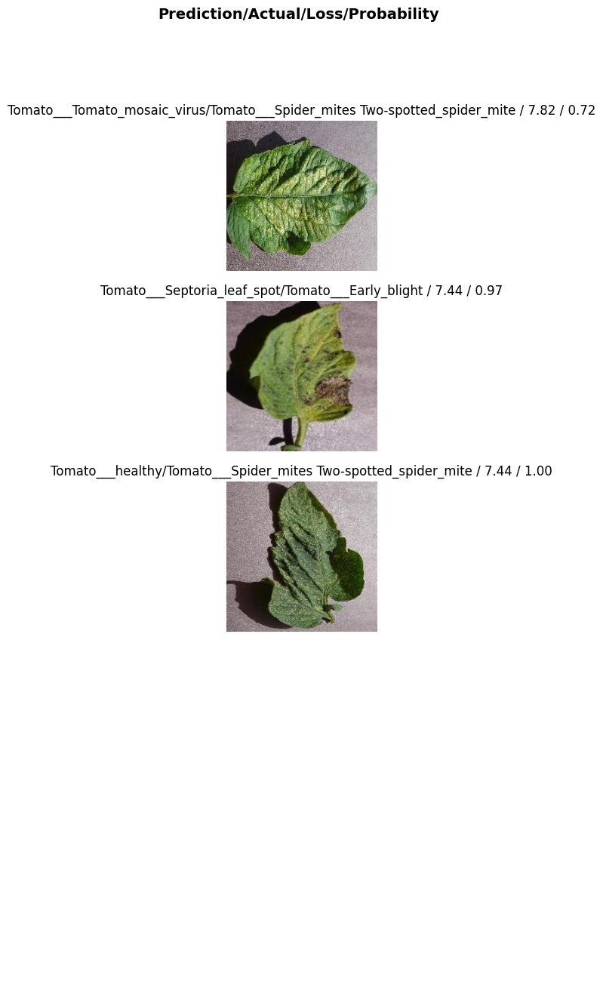

In [28]:
interp_vgg.plot_top_losses(3, nrows=5)